<a href="https://colab.research.google.com/github/mjgpinheiro/Physics_models/blob/main/ThermoAcousticCooler.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

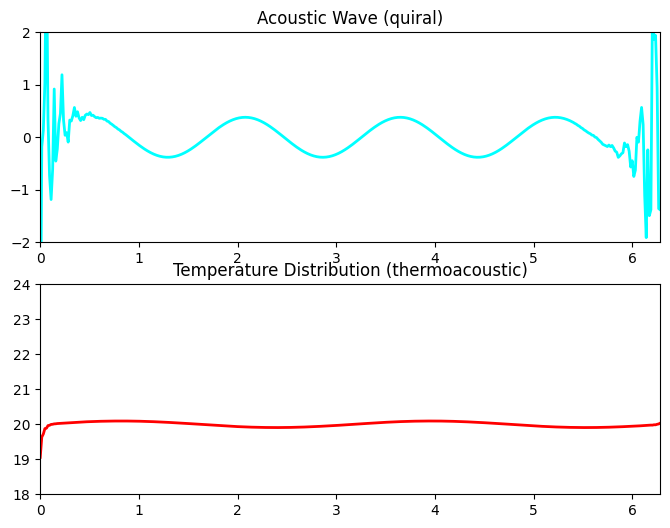

In [ ]:
# ------------------------------------------------------------
# Topological Thermoacoustic Cooler (TTC)
# Simulação 1D termo-acústica com assimetria Möbius-like
# Efeitos simulados:
#  - onda acústica direcional (quiral)
#  - streaming acústico
#  - transporte térmico assimétrico
#  - formação de "região quente" e "região fria"
#
# Pronto para Google Colab
# ------------------------------------------------------------

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# ------------------------------------------------------------
# PARÂMETROS FÍSICOS
# ------------------------------------------------------------
N = 400                         # pontos ao longo da banda
L = 2*np.pi                     # comprimento paramétrico
ds = L / N

c = 1.0                         # velocidade do som (escala normalizada)
omega = 1.3                     # rotação -> impõe quiralidade efetiva
kappa = 0.45                    # acoplamento ergontrópico
gamma_stream = 0.07             # intensidade do streaming acústico

alpha = 0.02                    # difusividade térmica (normalizada)

dt = 0.15 * ds / c              # passo temporal seguro

# ------------------------------------------------------------
# CAMPOS: pressão p(s), velocidade termoacústica u(s), temperatura T(s)
# ------------------------------------------------------------
s = np.linspace(0, L, N)

# onda acústica inicial
p = np.sin(4*s)
p_t = np.zeros(N)

# temperatura inicial
T = 20 + 0.1*np.sin(2*s)        # 20 °C com perturbação pequena

# ------------------------------------------------------------
# Função para indexação Möbius-like
# (espelha o índice à volta do fim - simula 1 torção)
# ------------------------------------------------------------
def mobius_idx(i):
    if i < 0:
        i = N - ((-i) % N)
    if i >= N:
        i = i % N
    return N - 1 - i   # reflexo -> torção


# ------------------------------------------------------------
# ANIMAÇÃO
# ------------------------------------------------------------
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8,6))
line_p, = ax1.plot([], [], lw=2, color='cyan')
line_T, = ax2.plot([], [], lw=2, color='red')

ax1.set_ylim(-2, 2)
ax1.set_xlim(0, L)
ax1.set_title("Acoustic Wave (quiral)")

ax2.set_ylim(18, 24)
ax2.set_xlim(0, L)
ax2.set_title("Temperature Distribution (thermoacoustic)")

def init():
    line_p.set_data([], [])
    line_T.set_data([], [])
    return line_p, line_T

# ------------------------------------------------------------
# STEP TEMPORAL
# ------------------------------------------------------------
def update(frame):
    global p, p_t, T

    # ---------- LAPACIANO MÖBIUS ----------
    lap = np.zeros(N)
    for i in range(N):
        lap[i] = (p[mobius_idx(i+1)] - 2*p[i] + p[mobius_idx(i-1)]) / ds**2

    # ---------- TERMO ERGONTRÓPICO ----------
    erg = kappa * np.gradient(p, ds)

    # ---------- EQUAÇÃO ACÚSTICA ----------
    p_tt = c**2 * lap + erg - omega * np.gradient(p_t, ds)

    p_t = p_t + dt * p_tt
    p   = p   + dt * p_t

    # ---------- STREAMING ACÚSTICO ----------
    # fluxo de ar proporcional ao quadrado da pressão (efeito conhecido)
    streaming = gamma_stream * (p**2)

    # ---------- EQUAÇÃO DO CALOR COM TRANSPORTE ----------
    T = T + dt * (
        alpha * np.gradient(np.gradient(T, ds), ds)
        - streaming * np.gradient(T, ds)
    )

    line_p.set_data(s, p)
    line_T.set_data(s, T)
    return line_p, line_T


ani = animation.FuncAnimation(
    fig, update, init_func=init,
    frames=350, interval=40, blit=True
)

HTML(ani.to_jshtml())
